In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import cv2
from scipy import ndimage
import imutils
from skimage.filters import threshold_local

In [26]:
def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype = "float32")

    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    # return the ordered coordinates
    return rect

def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")

    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

    # return the warped image
    return warped

In [33]:
low_threshold = 0.09
high_threshold = 0.17
weak = 100
strong = 255

image = "image.JPG"

def rgb2gray(rgb):
    """
        Converts an RGB image into grayscale
    """
    return np.dot(rgb[..., :3], [0.2989, 0.5870, 0.1140])


def visualize(imgs, m, n):
    """
        Visualize images with the matplotlib library
    """
    plt.figure(figsize=(20, 40))
    for i, img in enumerate(imgs):
        plt_idx = i+1
        plt.subplot(m, n, plt_idx)
        plt.imshow(img, cmap='gray')
    plt.show()

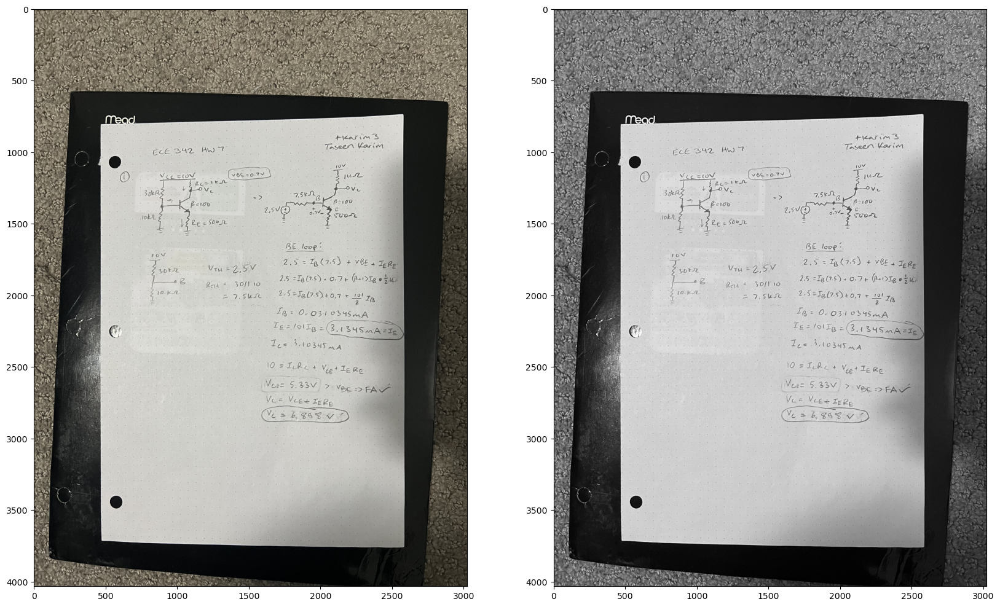

In [34]:
img = mpimg.imread(image)
gray_img = rgb2gray(img)
img_list = [img, gray_img]
img_uint8 = img.astype(np.uint8)

visualize(img_list, 1, 2)

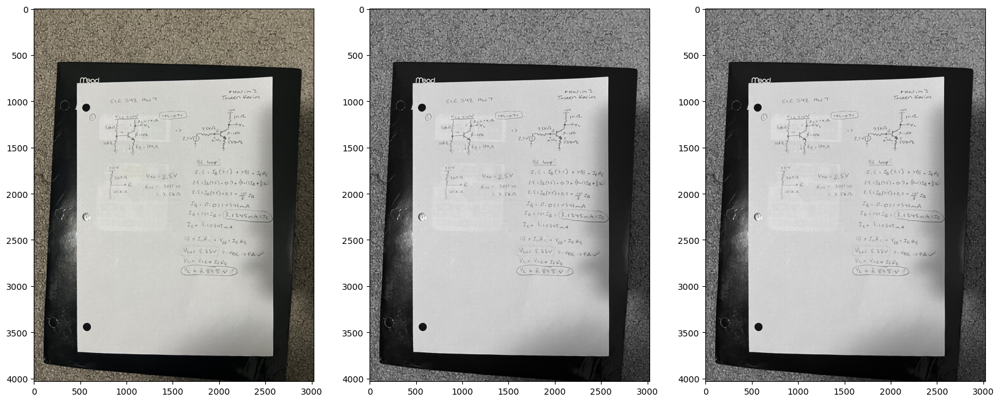

In [16]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g = np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

blurred_img = ndimage.convolve(gray_img, gaussian_kernel(5, 1.4))
img_list.append(blurred_img)

visualize(img_list, 1, 3)

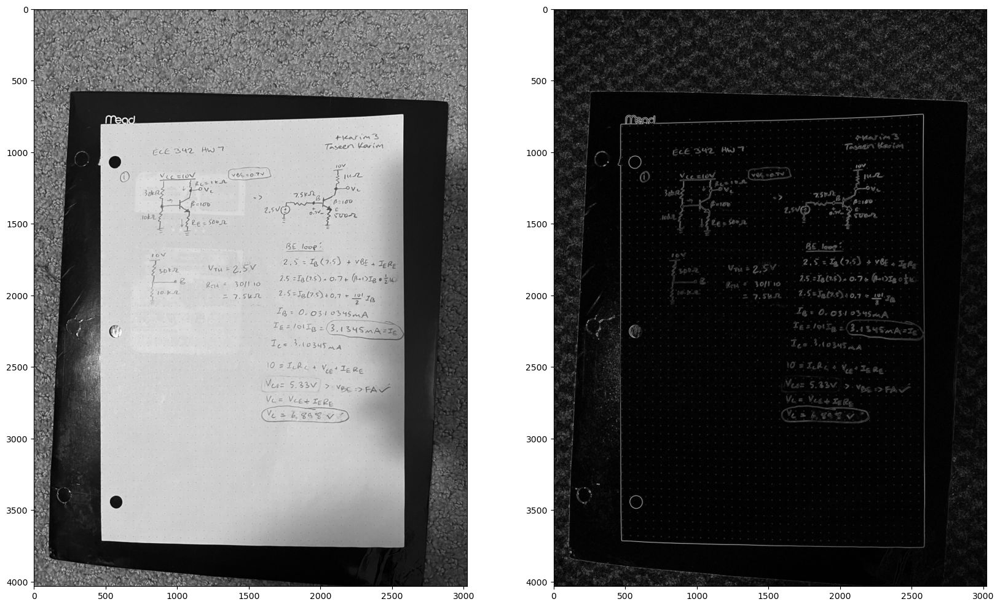

In [17]:
def sobel_filters(img):
    Kx = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]], dtype=np.float32)
    Ky = np.array([
        [1, 2, 1],
        [0, 0, 0],
        [-1, -2, -1]], dtype=np.float32)

    Ix = ndimage.convolve(img, Kx)
    Iy = ndimage.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

grad, theta = sobel_filters(blurred_img)

visualize([blurred_img, grad], 1, 2)

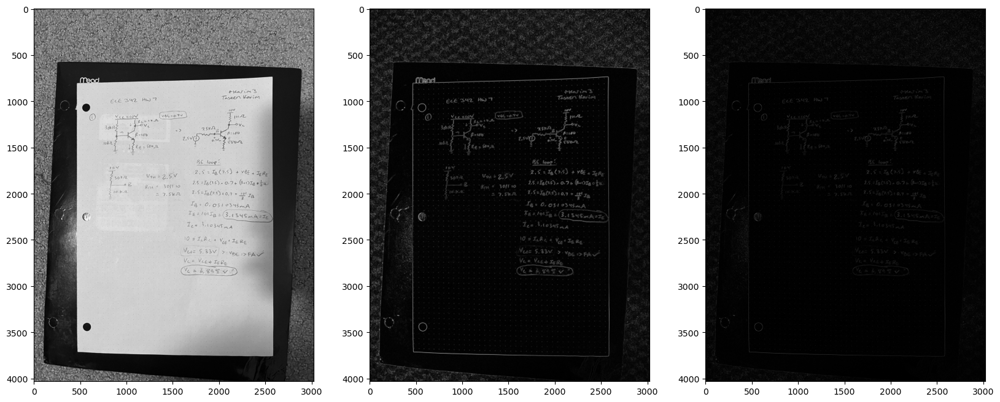

In [18]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M, N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    for i in range(1, M):
        for j in range(1, N):
            try:
                q = 255
                r = 255

               # angle 0
                if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                # angle 45
                elif (22.5 <= angle[i, j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                # angle 90
                elif (67.5 <= angle[i, j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                # angle 135
                elif (112.5 <= angle[i, j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i, j] >= q) and (img[i, j] >= r):
                    Z[i, j] = img[i, j]
                else:
                    Z[i, j] = 0

            except IndexError as e:
                pass
    return Z

nms_img = non_max_suppression(grad, theta)
visualize([blurred_img, grad, nms_img], 1, 3)

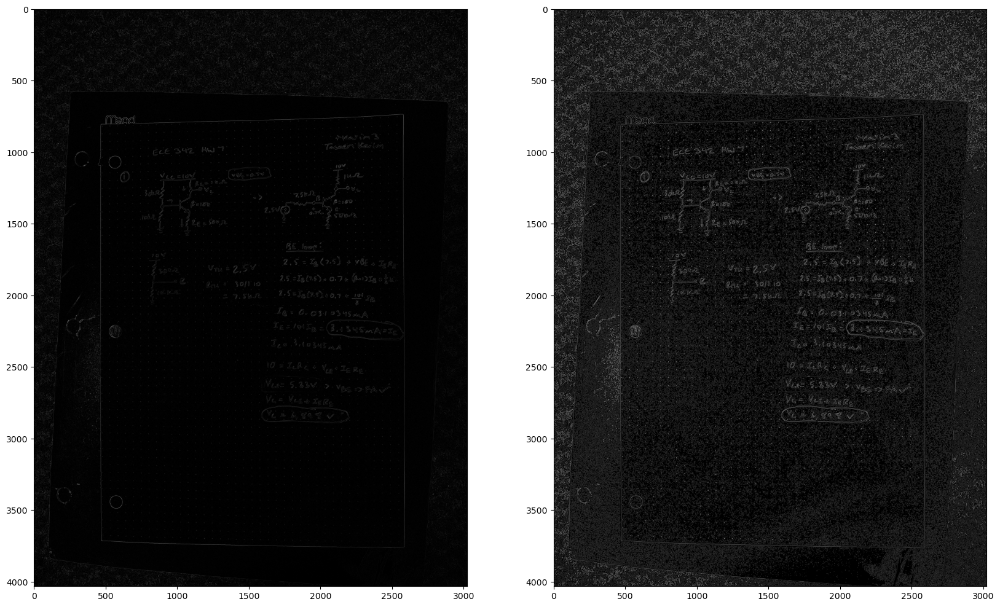

In [19]:
def threshold(img):
    high = img.max()*high_threshold
    low = high *low_threshold

    M, N = img.shape
    res = np.zeros((M, N), dtype=np.int32)

    strong_i, strong_j = np.where(img >= high)

    weak_i, weak_j = np.where((img >= low) & (img <= high))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return res

image_thresh = threshold(nms_img)

visualize([nms_img, image_thresh], 1, 2)

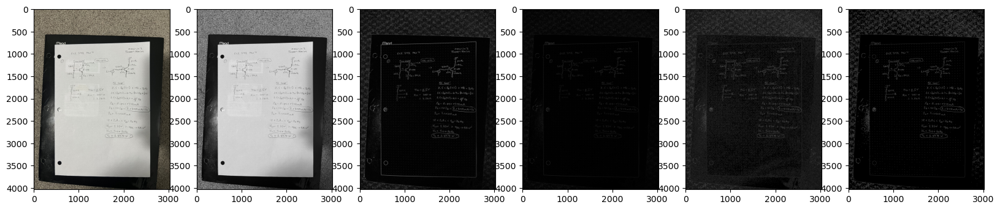

In [20]:
def hysteresis(img):
    M, N = img.shape

    res = np.copy(img)

    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i, j] == weak):
                try:
                    if (img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong) or (img[i, j-1] == strong) or (img[i, j+1] == strong) or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong):
                        res[i, j] = strong
                    else:
                        res[i, j] = 0
                except IndexError as e:
                    pass
    return res

canny = hysteresis(image_thresh)
visualize([img, blurred_img, grad, nms_img, image_thresh, canny], 1, 6)

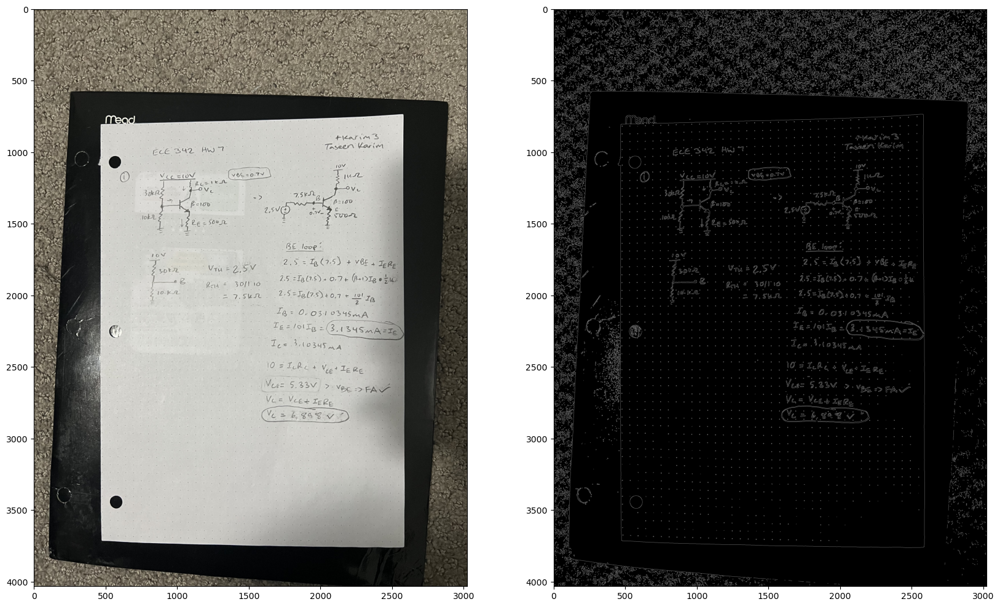

In [22]:
visualize([img, canny], 1, 2)

In [27]:
# read the image
img_path = 'image.jpg'
img = cv2.imread(img_path)


# resize and create a copy of the image
ratio = img.shape[0]/500.0
copy = img.copy()
image = imutils.resize(img, height = 500)

#gray scale the image, use gaussian blur to erase noise and apply canny edge detection filter

edges = hysteresis(image_thresh)
# edges = cv2.Canny(image,75,200)
edges_u8 = edges.astype(np.uint8)

# find all image contours and take 5 largest contours.
# find the contour with four sides and mark it with circles.
cnts, hierarchy = cv2.findContours(edges_u8.copy(),cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
cnts = sorted(cnts,key=cv2.contourArea,reverse=True)[:5]

for c in cnts:
    peri = cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,0.02*peri,True)
    if len(approx)==4:
        doc = approx
        break

# warp the image such that there is a scanned, overhead look of the document
warp = four_point_transform(copy, doc.reshape(4, 2) * ratio)
warp = cv2.cvtColor(warp, cv2.COLOR_BGR2GRAY)

# threshold image and save image
T = threshold_local(warp, 11, offset = 10, method = "gaussian")
warp = (warp > T).astype("uint8") * 255
#plt.imshow(imutils.resize(warp), 'gray')
plt.imshow(warp, 'gray')
plt.show()

cv2.imwrite('scanned.jpg', warp)

NameError: name 'doc' is not defined

True

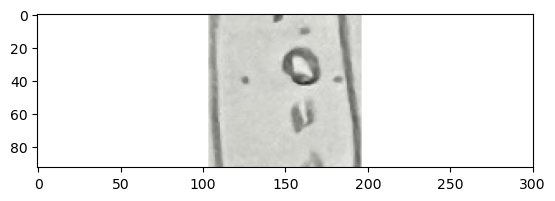

In [36]:
import cv2

# Load the image
# image = cv2.imread('image.jpg')
image = mpimg.imread(image)
# Apply Canny edge detection
canny = cv2.Canny(image, 75, 200)

# Find contours in the image
contours, _ = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour (which should be the document)
largest_contour = max(contours, key=cv2.contourArea)

# Extract the document from the image
x, y, w, h = cv2.boundingRect(largest_contour)
document = image[y:y+h, x:x+w]

# Apply perspective transformation
document_gray = cv2.cvtColor(document, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(document_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
coords = cv2.findNonZero(thresh)
rect = cv2.minAreaRect(coords)
angle = rect[2]
if angle < -45:
    angle += 90
rows, cols = document.shape[:2]
M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
document = cv2.warpAffine(document, M, (cols, rows), borderValue=(255,255,255))
plt.imshow(document)
# Save the processed image
cv2.imwrite('processed_document.jpg', document)